# 😀 Chapter 2: Statistical Learning
We will skip the first part of the section because we shall assume that we have the basics of programming in Python. Thus, we shall jump straight Chapter 3.

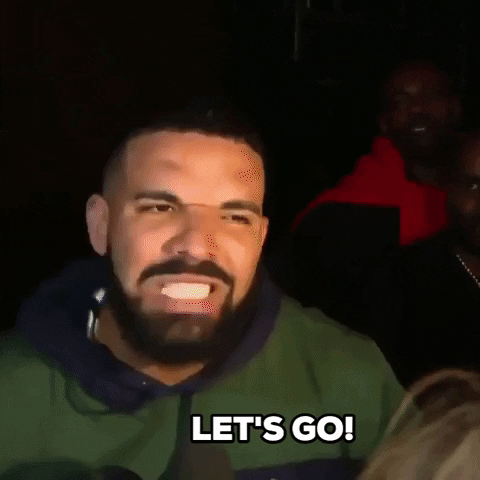

# 🚀 Chapter 3: Linear Regression


### 📦 Common Packages
The most common packages we shall use are as follows:

In [1]:
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots

### 📊 statsmodels and ISLP Packages

These are the most important packages for at least this Chapter. So, let's load them.

In [2]:
import statsmodels.api as sm

# the \ is a line continuation character
from statsmodels.stats.outliers_influence \
import variance_inflation_factor as VIF
from statsmodels.stats.anova import anova_lm

In [3]:
from ISLP import load_data
from ISLP.models import (ModelSpec as MS,
                         summarize,
                         poly)

## Part 1: 📈 Simple Linear Regression
Now that we have the packages loaded, let's get our hands dirty. We shall start with Simple Linear Regression using the famous Boston data as outlined in the textbook.

#### 📚 Theory Summary

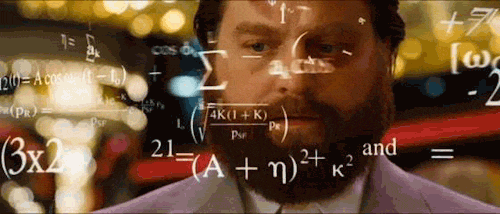

In summary, the `Simple Linear Regression` is defined as

$$Y = \beta_0 + \beta_1 X + \epsilon$$

#### 📊 Coefficient Estimating

To estimate $Y$ on the basis of $X = x$, we need to model

$$\hat{y} = \hat{\beta}_0 + \hat{\beta}_1$$

where

$$
\hat{\beta}_1 = \frac{\displaystyle \sum_{i=1}^{n}{(x_i - \overline{x})(y_i - \overline{y})}}{\displaystyle \sum_{i=1}^{n}{(x_i - \overline{x})}}
$$
and
$$
\hat{\beta}_0 = \overline{y} - \hat{\beta}_1 \overline{x}
$$

and the residual sum of square $RSS$ is defined by

$$
RSS = \displaystyle \sum_{i=1}^{n}{(y_i - \hat{\beta}_0 - \hat{\beta}_i x_i)}
$$


In [4]:
# load Boston housing data
Boston = load_data('Boston')
pd.DataFrame(Boston.columns)

,0
0,crim
1,zn
2,indus
3,chas
4,nox
5,rm
6,age
7,dis
8,rad
9,tax


For our Simple Linear Regression analysis, we will focus on two columns: `medv` (median value of owner-occupied homes) and `lstat` (percentage of lower status of the population).

Now, let's set the `X` and `y` variables first:

In [5]:
X = pd.DataFrame({'intercept': np.ones(Boston.shape[0]),
                  'lstat': Boston['lstat']})
X

,intercept,lstat
0,1.0,4.98
1,1.0,9.14
2,1.0,4.03
3,1.0,2.94
4,1.0,5.33
...,...,...
501,1.0,9.67
502,1.0,9.08
503,1.0,5.64
504,1.0,6.48


In [6]:
y = Boston['medv']
pd.DataFrame(y)

,medv
0,24.0
1,21.6
2,34.7
3,33.4
4,36.2
...,...
501,22.4
502,20.6
503,23.9
504,22.0


Now, here we fit the `Ordinary Least Square (OLS)` model

In [7]:
model = sm.OLS(y, X)
results = model.fit()

And then, we finally print out our regression model

In [8]:
summarize(results)

,coef,std err,t,P>|t|
intercept,34.5538,0.563,61.415,0.0
lstat,-0.9500,0.039,-24.528,0.0


#### 🔍 Interpretation of the Coefficients

The coefficient of lstat is -0.95, which means that for each one unit increase in lstat, the median value of the house decreases by \$0.95. The p-value of the coefficient is very small (P < 0.05), indicating that the coefficient is statistically significant.

## 🔄 Using Transformations: Fit and Transform

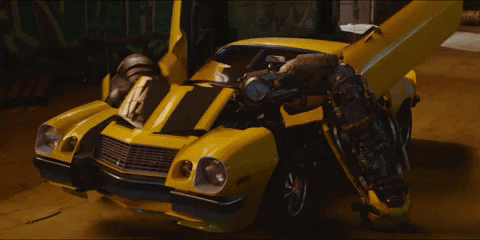

We will replicate the above process but with a different method or approach.

There are two methods to achieve this, but we will opt for this one. If you're interested in the first method, please refer to the textbook [ISLP pg. 128].

In [9]:
design = MS(['lstat'])
X = design.fit_transform(Boston)
X

,intercept,lstat
0,1.0,4.98
1,1.0,9.14
2,1.0,4.03
3,1.0,2.94
4,1.0,5.33
...,...,...
501,1.0,9.67
502,1.0,9.08
503,1.0,5.64
504,1.0,6.48


Now, let's print out the result or the prediction.

In [10]:
results.summary()
pd.DataFrame(results.params)

,0
intercept,34.553841
lstat,-0.950049


Now, we can utilize new data with the developed model to make predictions.

In [11]:
# generate dataframe for 'lstat' of ten integers and call it 'newdata'
newdata = pd.DataFrame({'lstat': np.linspace(5, 35, 10)})
newdata

,lstat
0,5.000000
1,8.333333
2,11.666667
3,15.000000
4,18.333333
5,21.666667
6,25.000000
7,28.333333
8,31.666667
9,35.000000


In [12]:
newX = design.transform(newdata)
newX

,intercept,lstat
0,1.0,5.000000
1,1.0,8.333333
2,1.0,11.666667
3,1.0,15.000000
4,1.0,18.333333
5,1.0,21.666667
6,1.0,25.000000
7,1.0,28.333333
8,1.0,31.666667
9,1.0,35.000000


And now we predict 🎯

In [13]:
newPrediction = results.get_prediction(newX)
pd.DataFrame(newPrediction.predicted_mean, columns=["predictions"])

,predictions
0,29.803594
1,26.636763
2,23.469932
3,20.303101
4,17.136269
5,13.969438
6,10.802607
7,7.635776
8,4.468945
9,1.302113


Now, we compute a 95% confidence interval.

In [14]:
pd.DataFrame(newPrediction.conf_int(alpha=0.05), columns=["lower", "upper"])

,lower,upper
0,29.007412,30.599776
1,26.002106,27.271420
2,22.921878,24.017986
3,19.731588,20.874613
4,16.442310,17.830228
5,13.094669,14.844208
6,9.717456,11.887759
7,6.324831,8.946720
8,2.923536,6.014353
9,-0.483016,3.087243


Prediction intervals are computing by setting `obs=True` [ISLP pg. 120]

In [15]:
pd.DataFrame(newPrediction.conf_int(obs=True, alpha=0.05), columns=["lower", "upper"])

,lower,upper
0,17.565675,42.041513
1,14.408290,38.865236
2,11.245647,35.694216
3,8.077742,32.528459
4,4.904575,29.367964
5,1.726155,26.212721
6,-1.457504,23.062718
7,-4.646379,19.917931
8,-7.840444,16.778333
9,-11.039663,13.643890


Now, let's do some plotting.

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to add a line with slope m and intercept b to ax
def abline(ax, b, m, *args, **kwargs):
    xlim = ax.get_xlim()
    ylim = [m * xlim[0] + b, m * xlim[1] + b]
    ax.plot(xlim, ylim, *args, **kwargs)

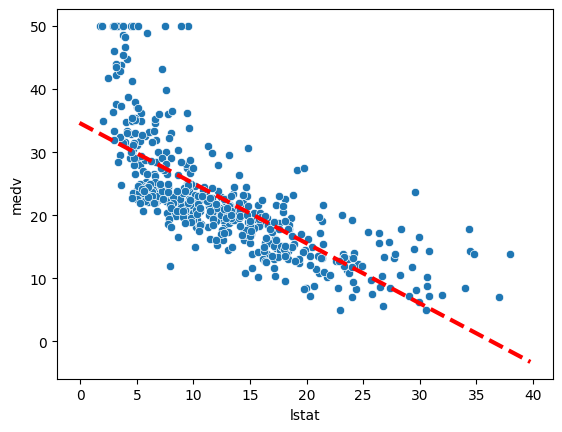

In [17]:
# Scatter plot with a line fit
ax = sns.scatterplot(data=Boston, x='lstat', y='medv')
abline(ax, results.params[0], results.params[1], 'r--', linewidth=3)

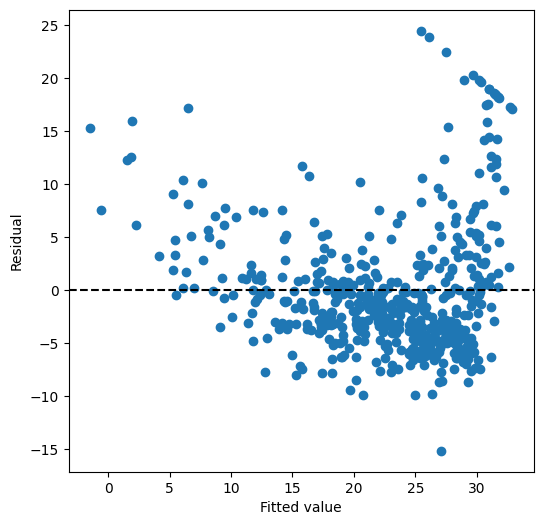

In [18]:
# Scatter plot of residuals
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(results.fittedvalues, results.resid)
ax.set_xlabel('Fitted value')
ax.set_ylabel('Residual')
ax.axhline(0, c='k', ls='--')

Text(0, 0.5, 'Leverage')

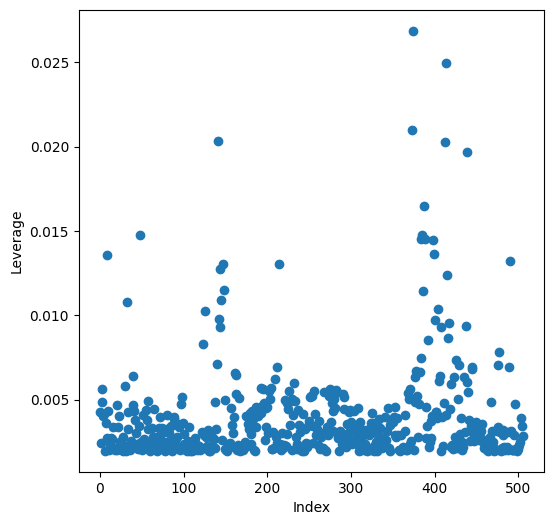

In [19]:
# Leverage plot
infl = results.get_influence()
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(np.arange(X.shape[0]), infl.hat_matrix_diag)
ax.set_xlabel('Index')
ax.set_ylabel('Leverage')

# On to the next one ➜

Next, we will delve into Multiple Linear Regression.

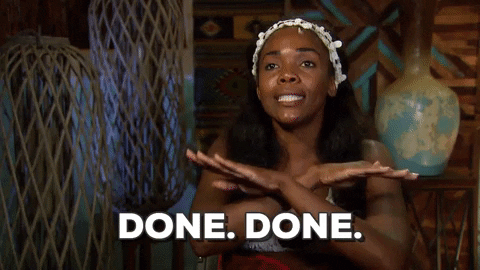